<a href="https://colab.research.google.com/github/husanaulakh/ENPH-353-Competition-Team12/blob/main/FormattedImitationLearner.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import random
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import math
import tensorflow as tf
from tensorflow import keras
from google.colab.patches import cv2_imshow
from keras import layers, models, optimizers, backend
from google.colab import drive
import shutil
# drive.mount('/content/drive')
from google.colab.patches import cv2_imshow

# Initial Training

In [ ]:
shutil.rmtree('/content/sample_data/whole_loop')

In [ ]:
!unzip /content/drive/MyDrive/Training/whole_loop.zip -d /content/sample_data;

Archive:  /content/drive/MyDrive/Training/whole_loop.zip
   creating: /content/sample_data/whole_loop/
  inflating: /content/sample_data/whole_loop/0-2023-04-06_11-21-20-431025.jpeg  
  inflating: /content/sample_data/whole_loop/1-2023-04-06_11-20-43-841501.jpeg  
  inflating: /content/sample_data/whole_loop/0-2023-04-06_11-21-19-227552.jpeg  
  inflating: /content/sample_data/whole_loop/1-2023-04-06_11-22-39-795928.jpeg  
  inflating: /content/sample_data/whole_loop/1-2023-04-06_11-20-21-769992.jpeg  
  inflating: /content/sample_data/whole_loop/1-2023-04-06_11-20-21-099826.jpeg  
  inflating: /content/sample_data/whole_loop/1-2023-04-06_11-20-19-294404.jpeg  
  inflating: /content/sample_data/whole_loop/0-2023-04-06_11-20-46-716155.jpeg  
  inflating: /content/sample_data/whole_loop/0-2023-04-06_11-21-53-189517.jpeg  
  inflating: /content/sample_data/whole_loop/1-2023-04-06_11-21-58-402607.jpeg  
  inflating: /content/sample_data/whole_loop/1-2023-04-06_11-21-58-803126.jpeg  
  infl

In [ ]:
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(72, 128, 3)))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(3, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 70, 126, 32)       896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 35, 63, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 33, 61, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 16, 30, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 14, 28, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 7, 14, 128)       0

In [ ]:
LEARNING_RATE = 1e-4
model.compile(loss='categorical_crossentropy',
                   optimizer=optimizers.RMSprop(lr=LEARNING_RATE),
                   metrics=['accuracy'])

/usr/local/lib/python3.9/dist-packages/keras/optimizers/legacy/rmsprop.py:143: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
def read_data(image_folder):
    frames = []
    actions = []
    filenames = sorted(os.listdir(image_folder))
    random.shuffle(filenames)
    for filename in filenames:
        if filename.endswith('.jpeg'):
            # extract action from filename
            action_str = filename.split('-')[0]
            action = np.zeros(3)
            action[int(action_str)] = 1
            actions.append(action)

            # read image
            img_path = os.path.join(image_folder, filename)
            img = cv2.imread(img_path)
            img = cv2.resize(img, (img.shape[1] // 10, img.shape[0] // 10)) # resize by 10x
            frames.append(img)

    return np.array(frames), np.array(actions)

In [ ]:
# image_folder = '/content/drive/My Drive/Training/training_images'
image_folder = '/content/sample_data/whole_loop'
frames, actions = read_data(image_folder)

In [ ]:
X_dataset = frames
Y_dataset = actions

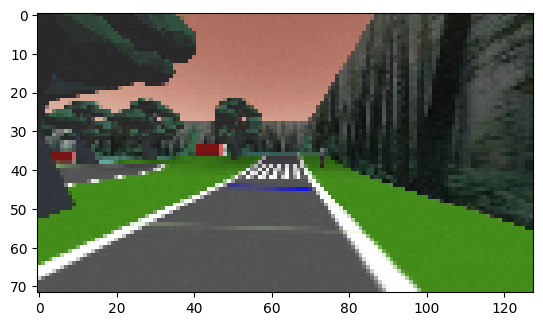

[0. 1. 0.]


In [ ]:
plt.imshow(frames[20])
plt.show()
print(actions[10])

In [ ]:
VALIDATION_SPLIT = 0.2

split_index = math.ceil(X_dataset.shape[0] * (1-VALIDATION_SPLIT))

X_train_dataset = X_dataset[:split_index]
Y_train_dataset = Y_dataset[:split_index]

X_val_dataset = X_dataset[split_index:]
Y_val_dataset = Y_dataset[split_index:]

# In this case we do not define a test set.

print("X shape: " + str(X_dataset.shape))
print("Y shape: " + str(Y_dataset.shape))
print("Total examples: {:d}\nTraining examples: {:d}\n"
      "Validation examples: {:d}".
      format(X_dataset.shape[0],
             X_train_dataset.shape[0],
             X_val_dataset.shape[0]))

X shape: (3177, 72, 128, 3)
Y shape: (3177, 3)
Total examples: 3177
Training examples: 2542
Validation examples: 635


In [ ]:
def reset_weights(model):
  for ix, layer in enumerate(model.layers):
      if (hasattr(model.layers[ix], 'kernel_initializer') and
          hasattr(model.layers[ix], 'bias_initializer')):
          weight_initializer = model.layers[ix].kernel_initializer
          bias_initializer = model.layers[ix].bias_initializer

          old_weights, old_biases = model.layers[ix].get_weights()

          model.layers[ix].set_weights([
              weight_initializer(shape=old_weights.shape),
              bias_initializer(shape=len(old_biases))])

In [ ]:
reset_weights(model)
history_conv = model.fit(X_train_dataset, Y_train_dataset, validation_split=VALIDATION_SPLIT, epochs=30)

/usr/local/lib/python3.9/dist-packages/keras/initializers/initializers.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


Epoch 1/30
64/64 [==============================] - 13s 21ms/step - loss: 4.8834 - accuracy: 0.4943 - val_loss: 0.6869 - val_accuracy: 0.7112
Epoch 2/30
64/64 [==============================] - 1s 13ms/step - loss: 1.0917 - accuracy: 0.6026 - val_loss: 0.6035 - val_accuracy: 0.7328
Epoch 3/30
64/64 [==============================] - 1s 15ms/step - loss: 0.7761 - accuracy: 0.7039 - val_loss: 0.4549 - val_accuracy: 0.8566
Epoch 4/30
64/64 [==============================] - 1s 15ms/step - loss: 0.6317 - accuracy: 0.7727 - val_loss: 0.3915 - val_accuracy: 0.8625
Epoch 5/30
64/64 [==============================] - 1s 15ms/step - loss: 0.5540 - accuracy: 0.8062 - val_loss: 0.3518 - val_accuracy: 0.8900
Epoch 6/30
64/64 [==============================] - 1s 15ms/step - loss: 0.5107 - accuracy: 0.8180 - val_loss: 0.3191 - val_accuracy: 0.8939
Epoch 7/30
64/64 [==============================] - 1s 14ms/step - loss: 0.4140 - accuracy: 0.8500 - val_loss: 0.3240 - val_accuracy: 0.8998
Epoch 8/30
6

In [ ]:
save_path = '/content/drive/My Drive/Training/TrainedImitator_90Plus.h5'
model.save(save_path)

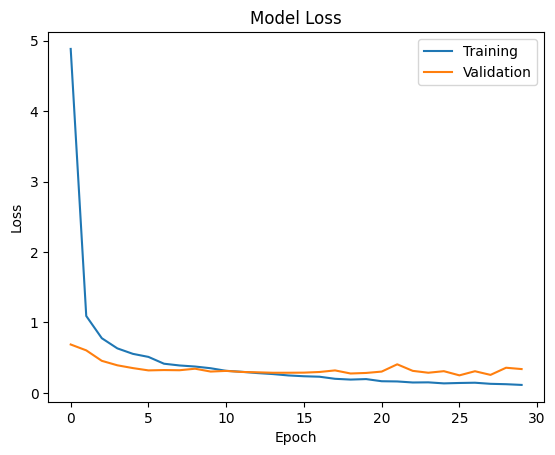

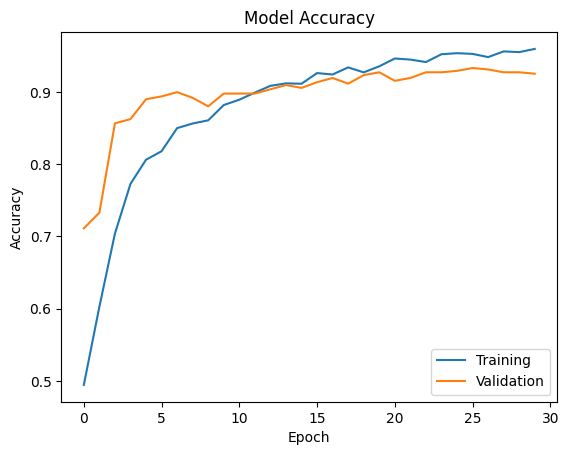

In [ ]:
history = history_conv
# Plot loss vs. epoch
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'], loc='upper right')
plt.show()

# Plot accuracy vs. epoch
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'], loc='lower right')
plt.show()

# Updating Training with more Frames

In [ ]:
zip_file_path = '/content/drive/MyDrive/Training/Desert.zip'
extraction_folder = '/content/sample_data'
!unzip $zip_file_path -d $extraction_folder;

In [ ]:
save_path = '/content/drive/My Drive/Training/TrainedImitator_wholeLoop.h5'
model = models.load_model(save_path)

In [ ]:
LEARNING_RATE = 1e-4
model.compile(loss='categorical_crossentropy',
                   optimizer=optimizers.RMSprop(lr=LEARNING_RATE),
                   metrics=['accuracy'])

In [ ]:
def read_data(image_folder):
    frames = []
    actions = []
    filenames = sorted(os.listdir(image_folder))
    random.shuffle(filenames)
    for filename in filenames:
        if filename.endswith('.jpeg'):
            # extract action from filename
            action_str = filename.split('-')[0]
            action = np.zeros(3)
            action[int(action_str)] = 1
            actions.append(action)

            # read image
            img_path = os.path.join(image_folder, filename)
            img = cv2.imread(img_path)
            img = cv2.resize(img, (img.shape[1] // 10, img.shape[0] // 10)) # resize by 10x
            frames.append(img)

    return np.array(frames), np.array(actions)

In [ ]:
image_folder = extraction_folder + '/Desert'
frames, actions = read_data(image_folder)
X_dataset = frames
Y_dataset = actions

In [ ]:
VALIDATION_SPLIT = 0.2

split_index = math.ceil(X_dataset.shape[0] * (1-VALIDATION_SPLIT))

X_train_dataset = X_dataset[:split_index]
Y_train_dataset = Y_dataset[:split_index]

X_val_dataset = X_dataset[split_index:]
Y_val_dataset = Y_dataset[split_index:]

# In this case we do not define a test set.

print("X shape: " + str(X_dataset.shape))
print("Y shape: " + str(Y_dataset.shape))
print("Total examples: {:d}\nTraining examples: {:d}\n"
      "Validation examples: {:d}".
      format(X_dataset.shape[0],
             X_train_dataset.shape[0],
             X_val_dataset.shape[0]))

In [ ]:
history_conv = model.fit(X_train_dataset, Y_train_dataset, validation_split=VALIDATION_SPLIT, epochs=1)

In [ ]:
save_path = '/content/drive/My Drive/Training/TrainedWholewithDesert.h5'
model.save(save_path)

# Testing Model

In [ ]:
save_path = '/content/drive/My Drive/Training/TrainedImitator.h5'
model = models.load_model(save_path)

In [ ]:
prediciton_frame = frames[2]
img_aug = np.expand_dims(frames[2], axis=0)
prediction = model.predict(img_aug)[0]

max_index = np.argmax(prediction)
result = np.zeros_like(prediction)
result[max_index] = 1
print(result)

img_rgb = cv2.cvtColor(frames[2], cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()
print(actions[0])

In [ ]:
selected_frames = np.random.choice(len(frames), size=10, replace=False)

# Loop over selected frames and make predictions
for frame_idx in selected_frames:
    # Get frame and make prediction
    prediction_frame = frames[frame_idx]
    img_aug = np.expand_dims(prediction_frame, axis=0)
    prediction = model.predict(img_aug)[0]

    # Get predicted action label
    max_index = np.argmax(prediction)
    result = np.zeros_like(prediction)
    result[max_index] = 1

    # Get actual action
    actual_label = actions[frame_idx]

    # Display predicted action label and frame
    print(f"Frame {frame_idx}:")
    print(f"  Predicted action: {result}")
    print(f"  Actual action: {actual_label}")
    img_rgb = cv2.cvtColor(prediction_frame, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.show()

In [ ]:
img_rgb = cv2.cvtColor(frames[2], cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()
print(actions[0])

# Pedestrian Analysis

In [ ]:
!unzip /content/drive/MyDrive/Training/outerloop_training_imagesV2.zip -d /content/sample_data;

Archive:  /content/drive/MyDrive/Training/outerloop_training_imagesV2.zip
   creating: /content/sample_data/outerloop_training_imagesV2/
  inflating: /content/sample_data/outerloop_training_imagesV2/1-2023-04-01_13-05-11-150196.jpeg  
  inflating: /content/sample_data/outerloop_training_imagesV2/1-2023-04-01_13-04-45-788331.jpeg  
  inflating: /content/sample_data/outerloop_training_imagesV2/1-2023-04-01_13-04-22-413471.jpeg  
  inflating: /content/sample_data/outerloop_training_imagesV2/1-2023-04-01_13-05-58-873993.jpeg  
  inflating: /content/sample_data/outerloop_training_imagesV2/1-2023-04-01_13-04-17-695835.jpeg  
  inflating: /content/sample_data/outerloop_training_imagesV2/1-2023-04-01_13-04-24-314616.jpeg  
  inflating: /content/sample_data/outerloop_training_imagesV2/1-2023-04-01_13-06-19-940711.jpeg  
  inflating: /content/sample_data/outerloop_training_imagesV2/1-2023-04-01_13-04-41-665764.jpeg  
  inflating: /content/sample_data/outerloop_training_imagesV2/0-2023-04-01_13-0

In [ ]:
def read_data(image_folder):
    frames = []
    actions = []
    filenames = sorted(os.listdir(image_folder))
    # random.shuffle(filenames)
    for filename in filenames:
        if filename.endswith('.jpeg'):
            # extract action from filename
            action_str = filename.split('-')[0]
            action = np.zeros(3)
            action[int(action_str)] = 1
            actions.append(action)

            # read image
            img_path = os.path.join(image_folder, filename)
            img = cv2.imread(img_path)
            # img = cv2.resize(img, (img.shape[1] // 10, img.shape[0] // 10)) # resize by 10x
            frames.append(img)

    return np.array(frames), np.array(actions)

In [ ]:
extraction_folder = '/content/sample_data'
image_folder = extraction_folder + '/outerloop_training_imagesV2'
frames, actions = read_data(image_folder)

In [ ]:
len(frames)

1798

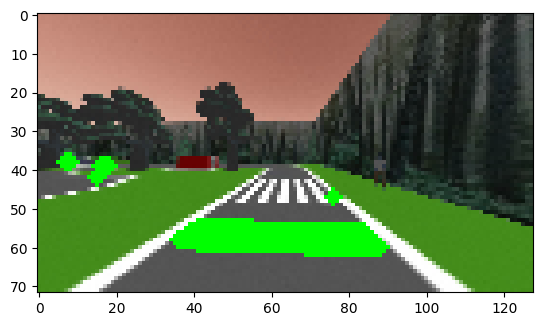

In [ ]:
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

# Apply a color threshold to extract the red pixels
lower_red = (0, 0, 100)
upper_red = (100, 100, 255)
mask_red = cv2.inRange(frame, lower_red, upper_red)

# Apply a binary threshold to create a binary mask
_, binary_mask = cv2.threshold(mask_red, 127, 255, cv2.THRESH_BINARY)

# Find the contours of the binary mask
contours, _ = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Draw the contours on the original frame
cv2.drawContours(frame, contours, -1, (0, 255, 0), 3)

# Display the result
plt.imshow(frame)
plt.show()

line detected


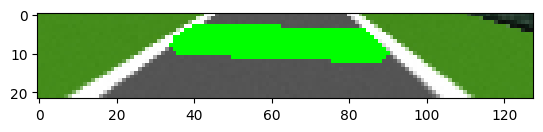

In [ ]:
frame = np.copy(frames[1050])
detected_redline = False
frame = frame[50:]
# Convert the frame to grayscale
gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

# Apply a color threshold to extract the red pixels
lower_red = (0, 0, 100)
upper_red = (100, 100, 255)
mask_red = cv2.inRange(frame, lower_red, upper_red)

# Apply a binary threshold to create a binary mask
_, binary_mask = cv2.threshold(mask_red, 127, 255, cv2.THRESH_BINARY)

# Find the contours of the binary mask
contours, _ = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Loop over the contours and check for a red line contour
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > 100 and area < 200:
        approx = cv2.approxPolyDP(cnt, 0.01*cv2.arcLength(cnt, True), True)
        if len(approx) == 4:
            detected_redline = True
            print("line detected")
            cv2.drawContours(frame, [approx], 0, (0, 255, 0), 3)
            break
# Display the result
plt.imshow(frame)
plt.show()

In [ ]:
print(detected_redline)

True


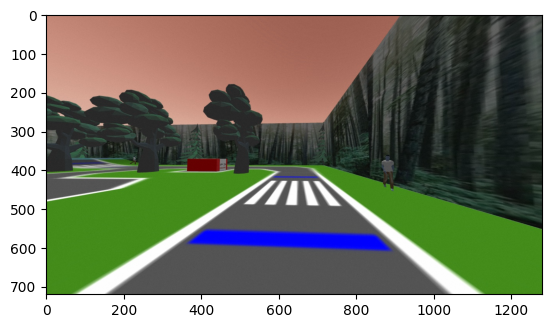

In [ ]:
plt.imshow(frames[1050])

In [ ]:
def read_data(image_folder):
    frames = []
    actions = []
    # filenames = sorted(os.listdir(image_folder))
    filenames = sorted(os.listdir(image_folder), key=lambda x: os.path.getmtime(os.path.join(image_folder, x)))

    # random.shuffle(filenames)

    # Extract only the 1050th frame
    filename = filenames[1050]
    if filename.endswith('.jpeg'):
        # extract action from filename
        action_str = filename.split('-')[0]
        action = np.zeros(3)
        action[int(action_str)] = 1
        actions.append(action)

        # read image
        img_path = os.path.join(image_folder, filename)
        img = cv2.imread(img_path)
        # img = cv2.resize(img, (img.shape[1] // 10, img.shape[0] // 10)) # resize by 10x
        frames.append(img)

    return np.array(frames), np.array(actions)

In [ ]:
extraction_folder = '/content/sample_data'
image_folder = extraction_folder + '/outerloop_training_imagesV2'
frame, action = read_data(image_folder)

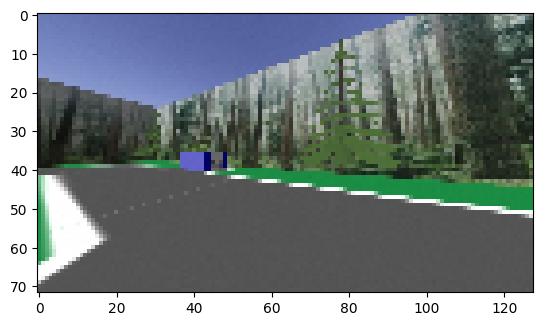

In [ ]:
img = np.copy(frames[10])
img = cv2.resize(img, (img.shape[1] // 10, img.shape[0] // 10)) # resize by 10x
# plt.imshow(img)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the result
plt.imshow(img_rgb)
plt.show()

line detected


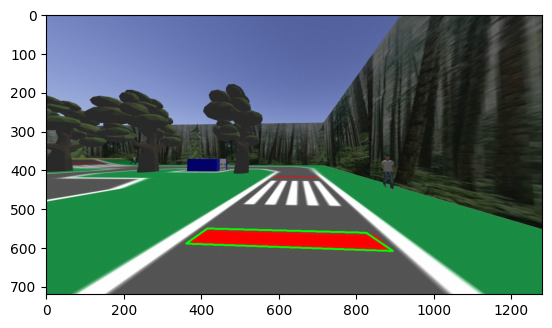

In [ ]:
img = np.copy(frames[1050])
detected_redline = False
# img = img[550:600, 200:1000]
# Convert the frame to grayscale
# gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

# Apply a color threshold to extract the red pixels
lower_red = (0, 0, 100)
upper_red = (100, 100, 255)
mask_red = cv2.inRange(img, lower_red, upper_red)

# Apply a binary threshold to create a binary mask
_, binary_mask = cv2.threshold(mask_red, 120, 255, cv2.THRESH_BINARY)

# Find the contours of the binary mask
contours, _ = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Loop over the contours and check for a red line contour
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > 100 and area < 200000:
        approx = cv2.approxPolyDP(cnt, 0.01*cv2.arcLength(cnt, True), True)
        if len(approx) == 4:
            detected_redline = True
            print("line detected")
            cv2.drawContours(img, [approx], 0, (0, 255, 0), 3)
            break
# Convert the color from BGR to RGB
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the result
plt.imshow(img_rgb)
plt.show()
# # Display the result
# plt.imshow(img)
# plt.show()

10989.5
line detected
244.5
line detected


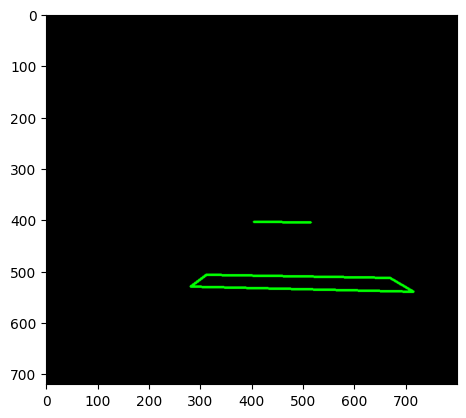

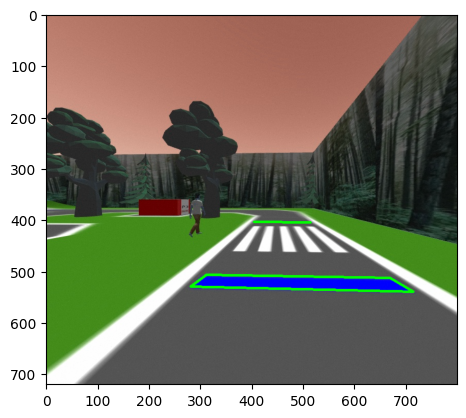

In [ ]:
img = np.copy(frames[179])
detected_redline = False
count = 0
img = img[:, 200:1000]


# Convert the frame to HSV color space
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Define the lower and upper range of red color in HSV
lower_red = np.array([0, 100, 100])
upper_red = np.array([10, 255, 255])

# Create a mask of the red color using the defined range
mask_red = cv2.inRange(hsv, lower_red, upper_red)

# Apply a binary threshold to create a binary mask
_, binary_mask = cv2.threshold(mask_red, 12, 255, cv2.THRESH_BINARY)

# Find the contours of the binary mask
contours, _ = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

contour_img = np.zeros_like(img)

# Loop over the contours and check for a red line contour
for cnt in contours:
    area = cv2.contourArea(cnt)
    count +=1
    # print(area)
    if area > 200 and area < 25000:
        print(area)
        approx = cv2.approxPolyDP(cnt, 0.01*cv2.arcLength(cnt, True), True)
        # print("Approx " + str(count) + " " + str(approx))
        # if len(approx) == 4:
        detected_redline = True
        # print("line detected")
        count +=1
        if count >= 2:
          print("line detected")
        # print(count)
        cv2.drawContours(contour_img, [approx], 0, (0, 255, 0), 3)
        cv2.drawContours(img, [approx], 0, (0, 255, 0), 3)
        # break

# Display the result
plt.imshow(contour_img)
plt.show()

plt.imshow(img)
plt.show()

20460.5
line detected
225.5
line detected


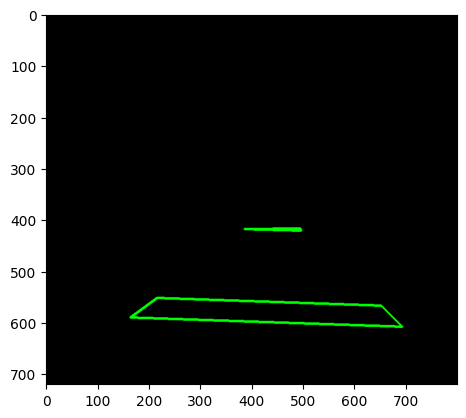

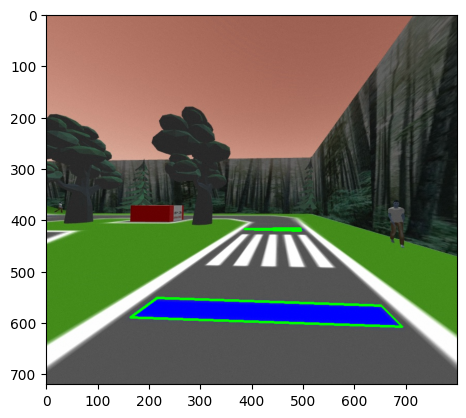

In [ ]:
img = np.copy(frames[1050])
detected_redline = False
count = 0
img = img[:, 200:1000]


# Convert the frame to HSV color space
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Define the lower and upper range of red color in HSV
lower_red = np.array([0, 100, 100])
upper_red = np.array([10, 255, 255])

# Create a mask of the red color using the defined range
mask_red = cv2.inRange(hsv, lower_red, upper_red)

# Apply a binary threshold to create a binary mask
_, binary_mask = cv2.threshold(mask_red, 12, 255, cv2.THRESH_BINARY)

# Find the contours of the binary mask
contours, _ = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

contour_img = np.zeros_like(img)

# Loop over the contours and check for a red line contour
for cnt in contours:
    area = cv2.contourArea(cnt)
    count +=1
    # print(area)
    if area > 200 and area < 25000:
        print(area)
        approx = cv2.approxPolyDP(cnt, 0.01*cv2.arcLength(cnt, True), True)
        # print("Approx " + str(count) + " " + str(approx))
        # if len(approx) == 4:
        detected_redline = True
        # print("line detected")
        count +=1
        if count >= 2:
          print("line detected")
        # print(count)
        cv2.drawContours(contour_img, [approx], 0, (0, 255, 0), 3)
        cv2.drawContours(img, [approx], 0, (0, 255, 0), 3)
        # break

# Display the result
plt.imshow(contour_img)
plt.show()

plt.imshow(img)
plt.show()

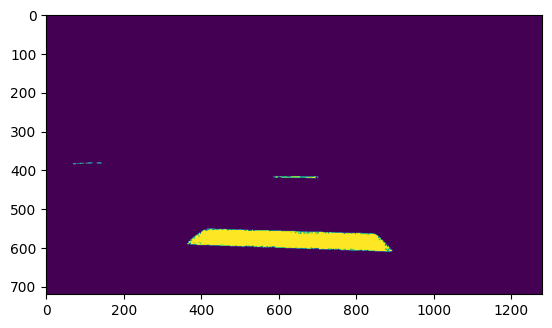

In [ ]:
img = np.copy(frame[0])
detected_redline = False

# Convert the image to HSV color space
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Define the lower and upper bounds of the red color in HSV
lower_red = np.array([0, 100, 100])
upper_red = np.array([10, 255, 255])

# Create a mask to keep only the red pixels in the image
mask = cv2.inRange(hsv, lower_red, upper_red)

# Apply a binary threshold to convert the mask into a binary image
_, binary_mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

plt.imshow(mask)
plt.show()

# plt.imshow(binary_mask)
# plt.show()

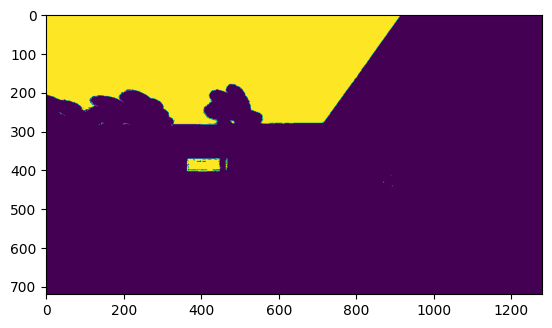

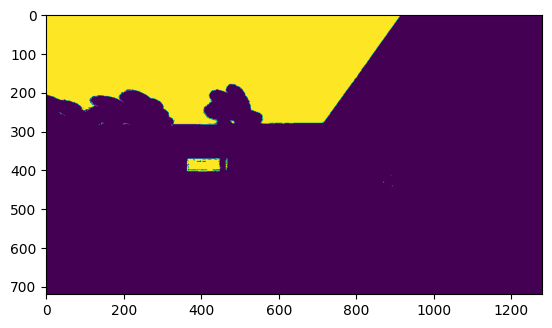

In [ ]:
print(detected_redline)

True


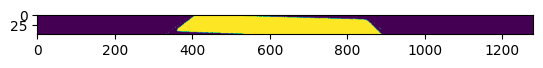

In [ ]:
plt.imshow(binary_mask)

In [ ]:
# Find the indices where the binary mask is non-zero
indices = np.where(binary_mask != 0)

# Get the left-most and right-most indices
left_index = np.min(indices[1])
right_index = np.max(indices[1])
print(left_index)
print(right_index)

334
888


# Testing Skin

In [ ]:
!unzip /content/drive/MyDrive/Training/outerloop_training_imagesV2.zip -d /content/sample_data;

Archive:  /content/drive/MyDrive/Training/outerloop_training_imagesV2.zip
replace /content/sample_data/outerloop_training_imagesV2/1-2023-04-01_13-05-11-150196.jpeg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
def read_data(image_folder):
    frames = []
    actions = []
    # filenames = sorted(os.listdir(image_folder))
    filenames = sorted(os.listdir(image_folder), key=lambda x: os.path.getmtime(os.path.join(image_folder, x)))

    # random.shuffle(filenames)
    for filename in filenames:
        if filename.endswith('.jpeg'):
            # extract action from filename
            action_str = filename.split('-')[0]
            action = np.zeros(3)
            action[int(action_str)] = 1
            actions.append(action)

            # read image
            img_path = os.path.join(image_folder, filename)
            img = cv2.imread(img_path)
            # img = cv2.resize(img, (img.shape[1] // 10, img.shape[0] // 10)) # resize by 10x
            frames.append(img)

    return np.array(frames), np.array(actions)

In [ ]:
extraction_folder = '/content/sample_data'
image_folder = extraction_folder + '/outerloop_training_imagesV2'
# image_folder = extraction_folder + '/whole_loop'
frames, actions = read_data(image_folder)

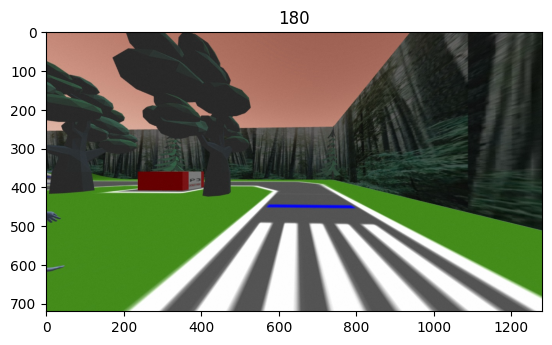

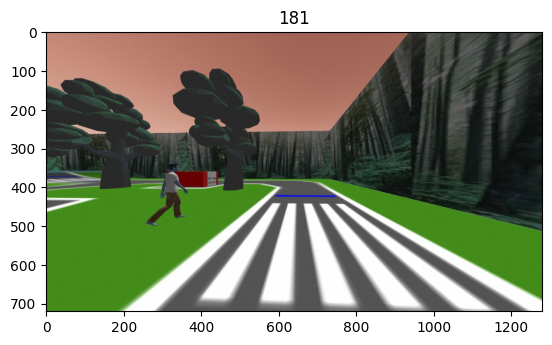

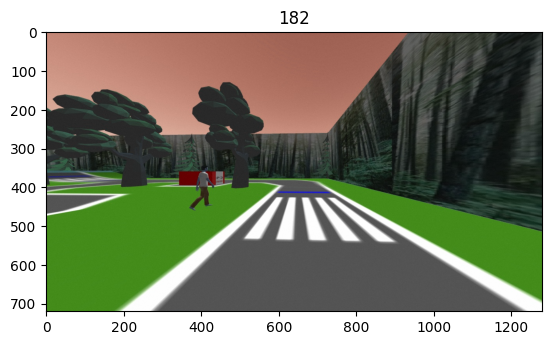

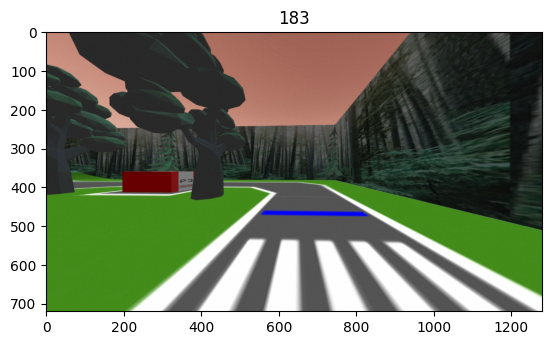

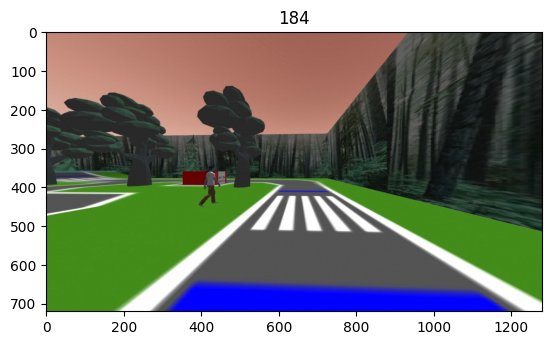

...

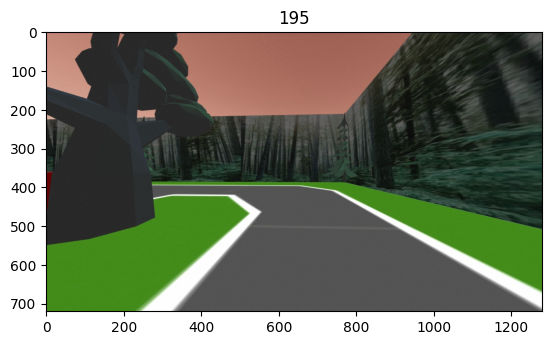

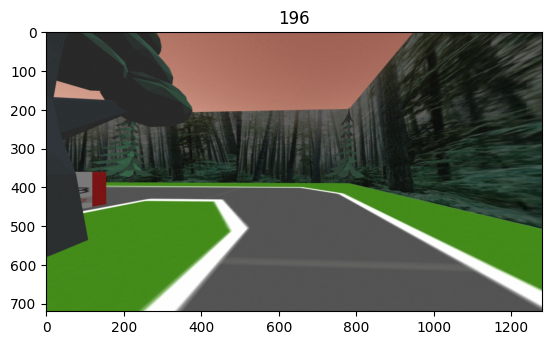

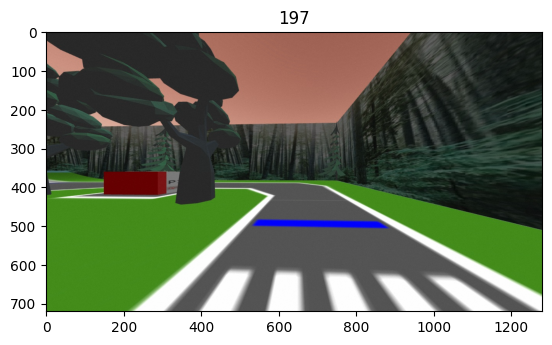

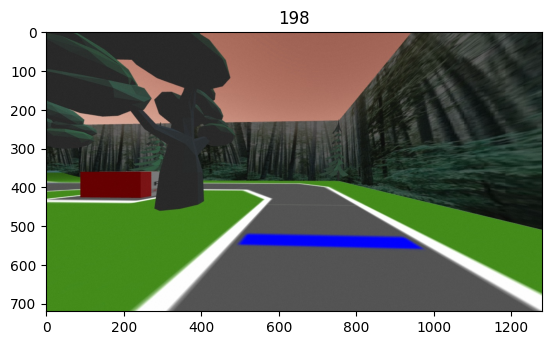

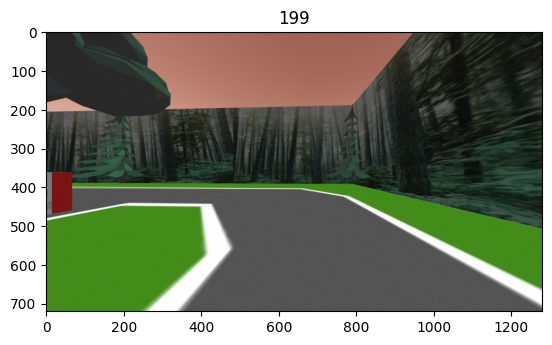

In [ ]:
for i in range(180,200):
  frame = frames[i]
  plt.imshow(frame)
  plt.title(i)
  plt.show()

# 177-186
# cv2_imshow(frames[180])

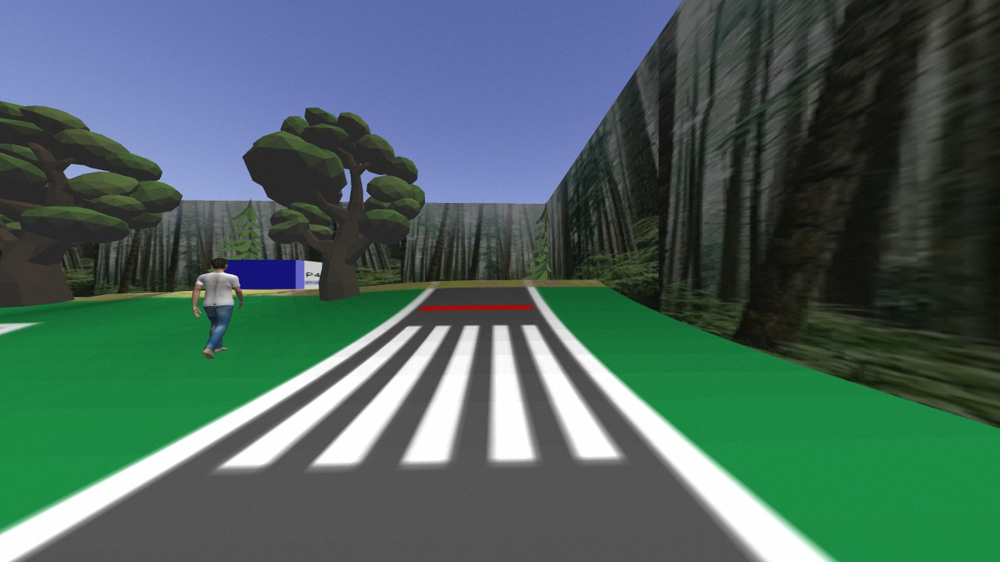

In [ ]:
cv2_imshow(frames[320])

In [ ]:
first_sidewalk = frames[177:186]
second_sidewalk = frames[300:320]

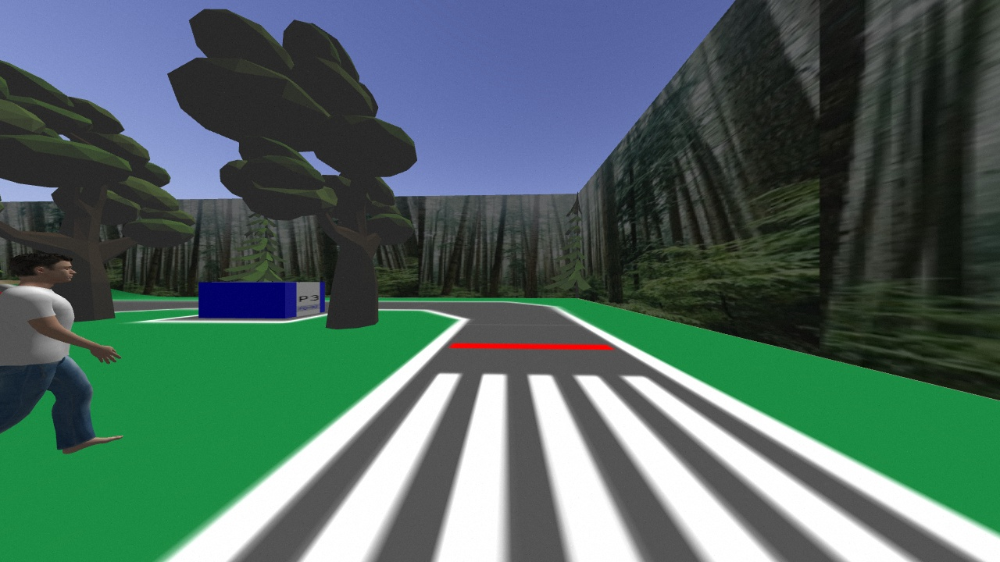

In [ ]:
cv2_imshow(frames[181])

Number of white pixels in binary mask: 2115


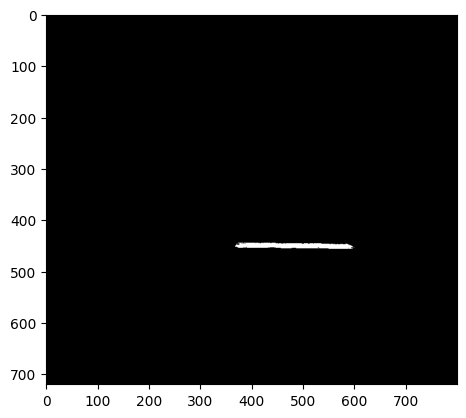

In [ ]:
img = np.copy(frames[184])
detected_redline = False
count = 0
img = img[:, 200:1000]

# Convert the frame to HSV color space
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Define the lower and upper range of red color in HSV
lower_red = np.array([0, 95, 95])
upper_red = np.array([15, 255, 255])

# Create a mask of the red color using the defined range
mask_red = cv2.inRange(hsv, lower_red, upper_red)

# Apply a binary threshold to create a binary mask
_, binary_mask = cv2.threshold(mask_red, 12, 255, cv2.THRESH_BINARY)

# Count the number of white pixels in the binary mask
count = cv2.countNonZero(binary_mask)

print("Number of white pixels in binary mask:", count)

plt.imshow(mask_red, 'gray')

Non-zero pixel counts: [1368, 12057, 1077, 19473, 2085, 1126, 4232, 34402, 1551, 2653, 3368, 892, 1859, 64118, 1207, 947, 1450, 2433, 853, 3936]


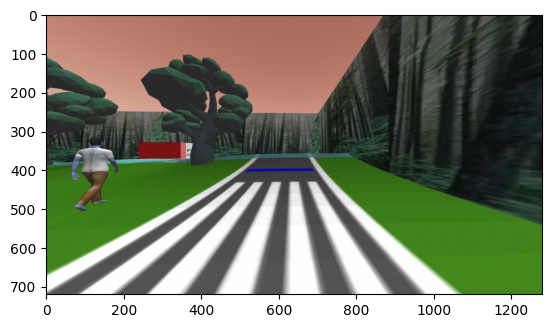

In [ ]:
nonzero_counts = []

for i in range(300, 320):
    img = np.copy(frames[i])
    count = 0
    img = img[:, 200:1000]

    # Convert the frame to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Define the lower and upper range of red color in HSV
    lower_red = np.array([0, 95, 95])
    upper_red = np.array([15, 255, 255])

    # Create a mask of the red color using the defined range
    mask_red = cv2.inRange(hsv, lower_red, upper_red)

    # Apply a binary threshold to create a binary mask
    _, binary_mask = cv2.threshold(mask_red, 127, 255, cv2.THRESH_BINARY)


    # Count the number of non-zero pixels in the binary mask
    count = cv2.countNonZero(binary_mask)

    # Append the count to the list of nonzero_counts
    nonzero_counts.append(count)

# Print the number of nonzero pixels for each frame
print("Non-zero pixel counts:", nonzero_counts)
plt.imshow(frames[314])

Non-zero pixel counts: [4863, 6812, 11792, 668, 1357, 25697, 45116, 2115, 1738]


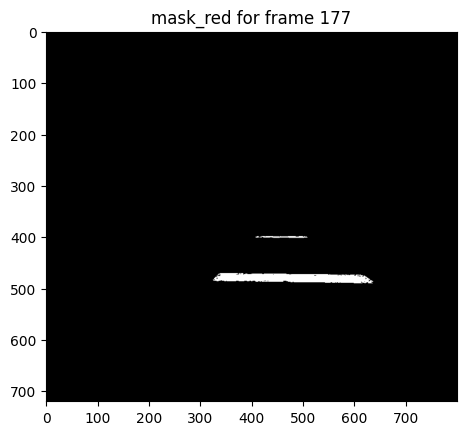

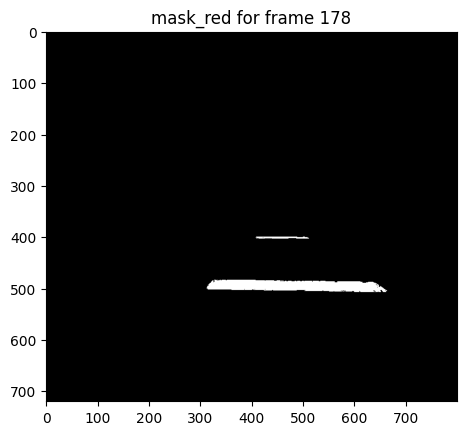

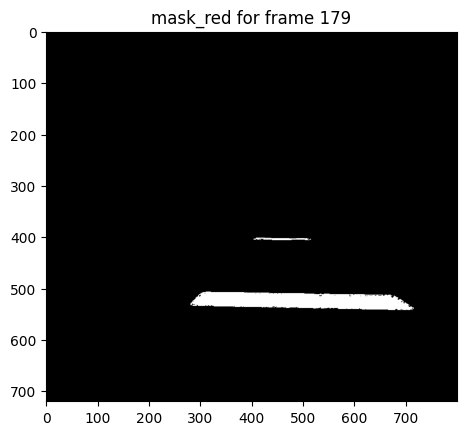

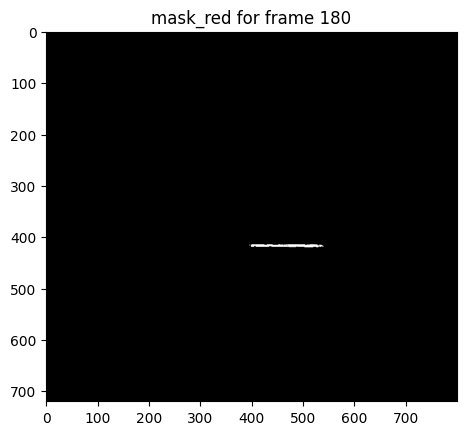

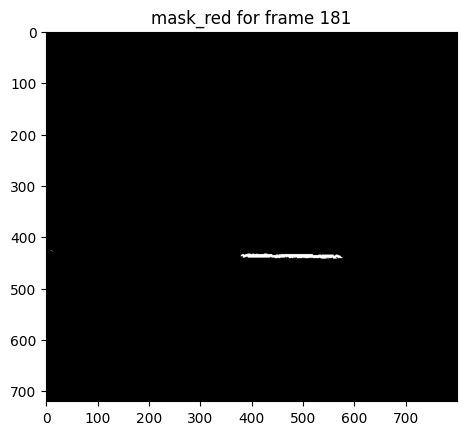

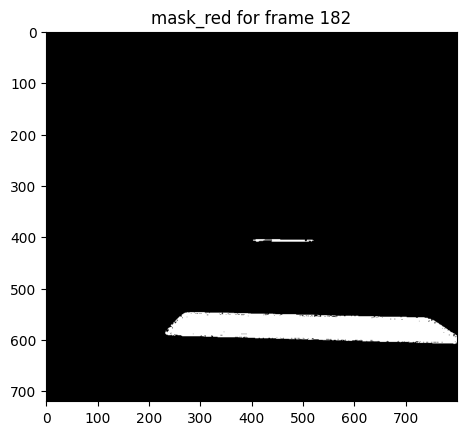

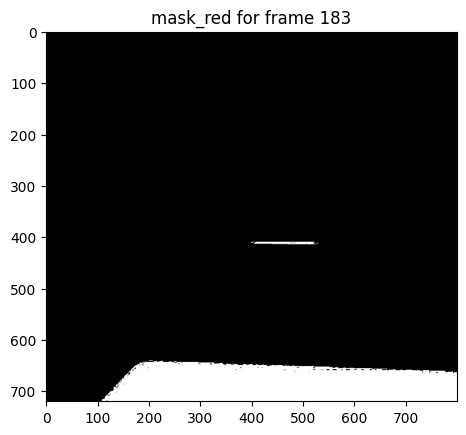

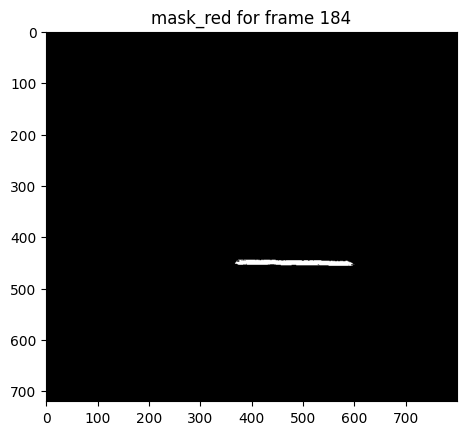

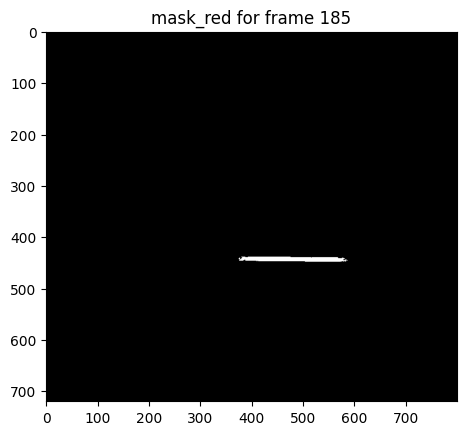

In [ ]:
import matplotlib.pyplot as plt

nonzero_counts = []

for i in range(177, 186):
    img = np.copy(frames[i])
    count = 0
    img = img[:, 200:1000]

    # Convert the frame to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Define the lower and upper range of red color in HSV
    lower_red = np.array([0, 95, 95])
    upper_red = np.array([15, 255, 255])

    # Create a mask of the red color using the defined range
    mask_red = cv2.inRange(hsv, lower_red, upper_red)

    # Apply a binary threshold to create a binary mask
    _, binary_mask = cv2.threshold(mask_red, 12, 255, cv2.THRESH_BINARY)

    # Count the number of non-zero pixels in the binary mask
    count = cv2.countNonZero(binary_mask)

    # Append the count to the list of nonzero_counts
    nonzero_counts.append(count)

    # Show the mask_red index and the mask_red image using Matplotlib
    plt.figure()
    plt.imshow(mask_red, cmap="gray")
    plt.title("mask_red for frame " + str(i))

# Print the number of nonzero pixels for each frame
print("Non-zero pixel counts:", nonzero_counts)

# Show all images using Matplotlib
plt.show()


Index: 300 Non-zero pixel count: 1368


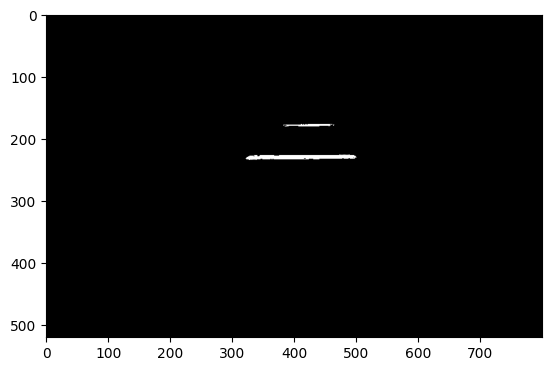

Index: 301 Non-zero pixel count: 12057


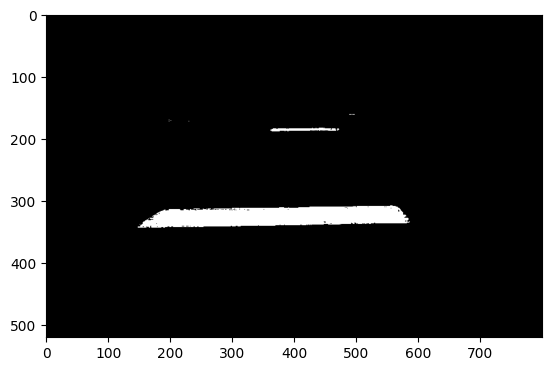

Index: 302 Non-zero pixel count: 1077


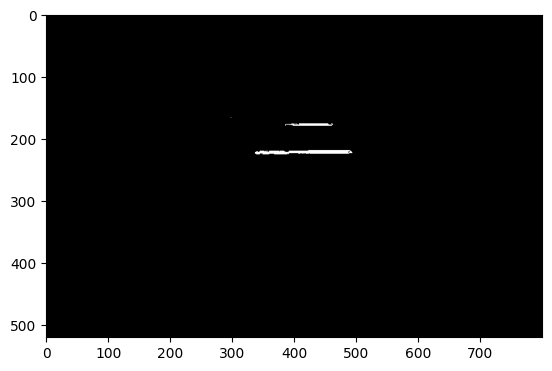

Index: 303 Non-zero pixel count: 19473


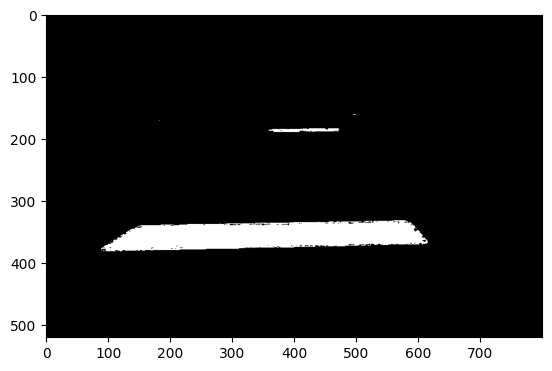

Index: 304 Non-zero pixel count: 2085


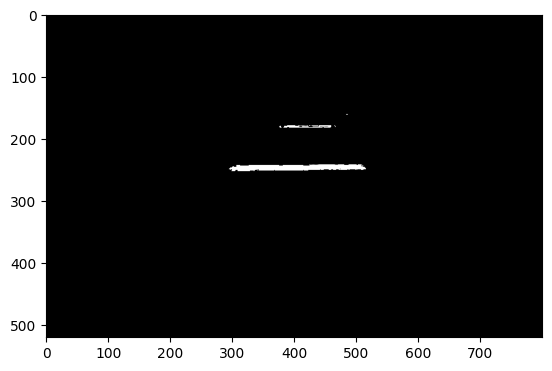

Index: 305 Non-zero pixel count: 1126


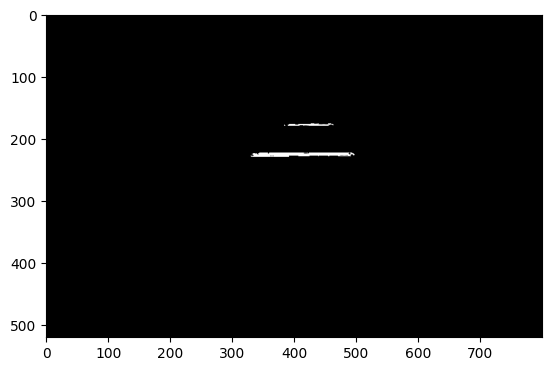

Index: 306 Non-zero pixel count: 4232


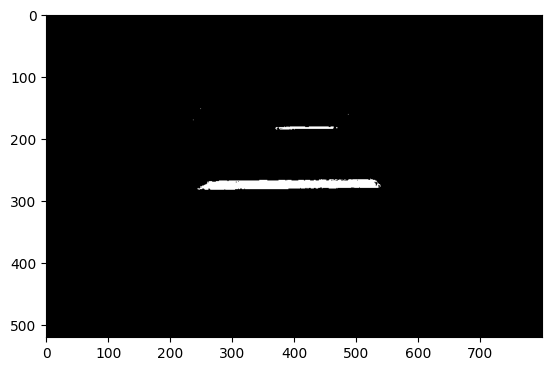

Index: 307 Non-zero pixel count: 34402


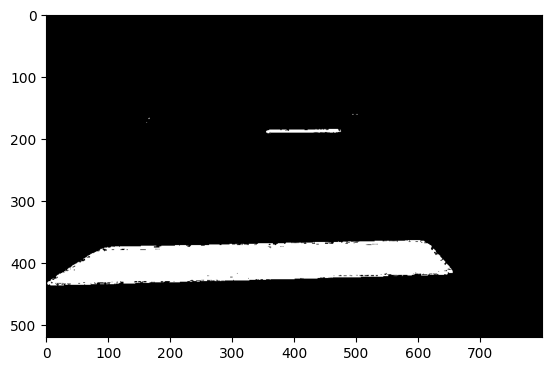

Index: 308 Non-zero pixel count: 1551


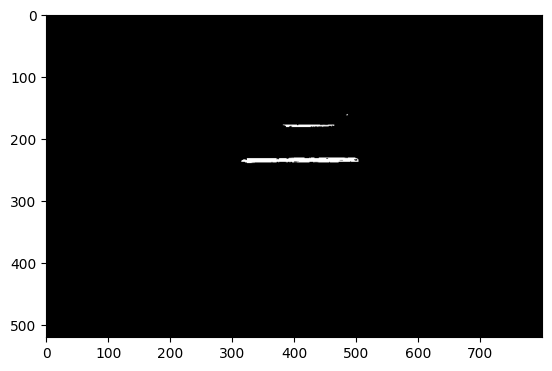

Index: 309 Non-zero pixel count: 2653


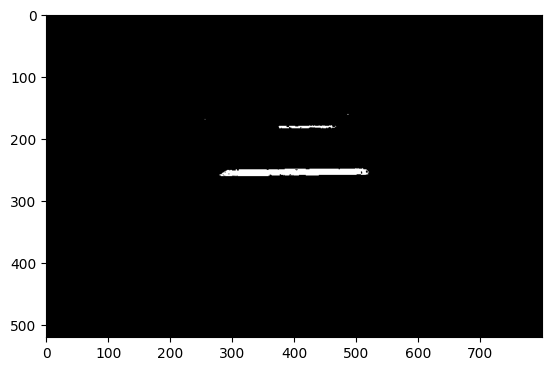

Index: 310 Non-zero pixel count: 3368


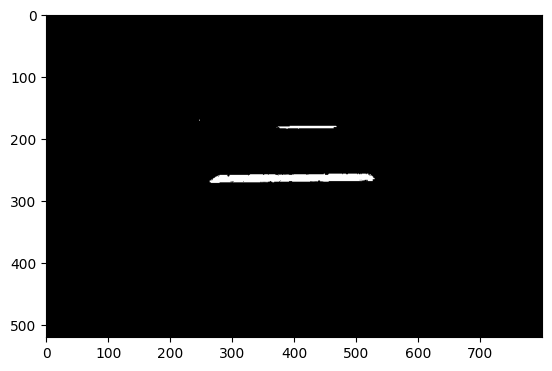

Index: 311 Non-zero pixel count: 892


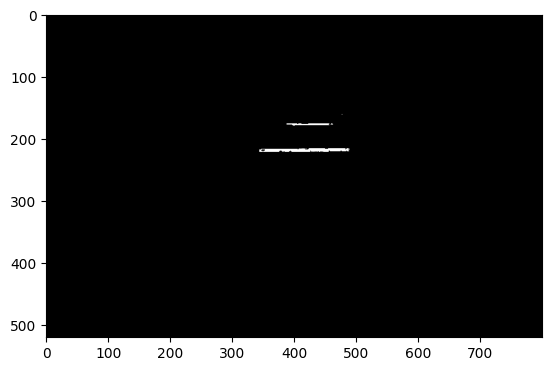

Index: 312 Non-zero pixel count: 1859


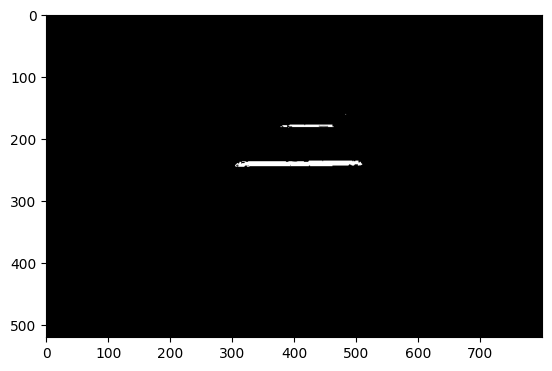

Index: 313 Non-zero pixel count: 64118


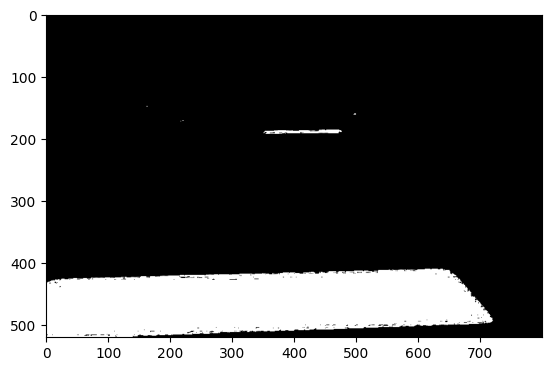

Index: 314 Non-zero pixel count: 1207


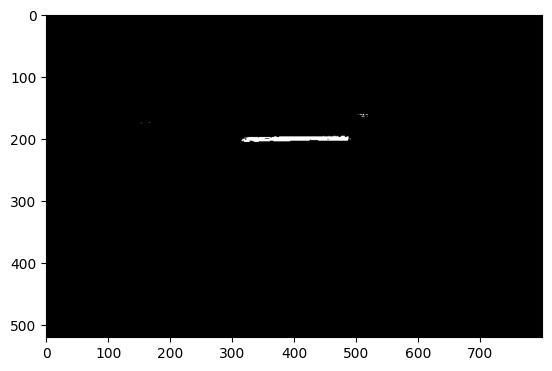

Index: 315 Non-zero pixel count: 947


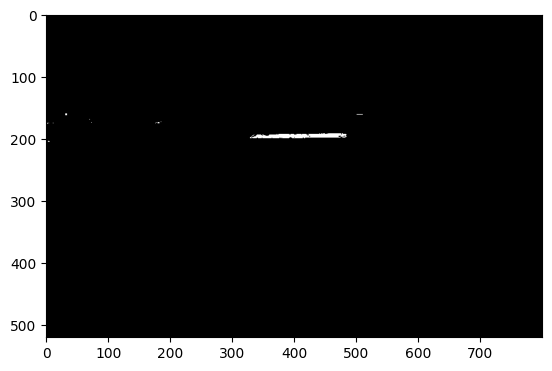

Index: 316 Non-zero pixel count: 1450


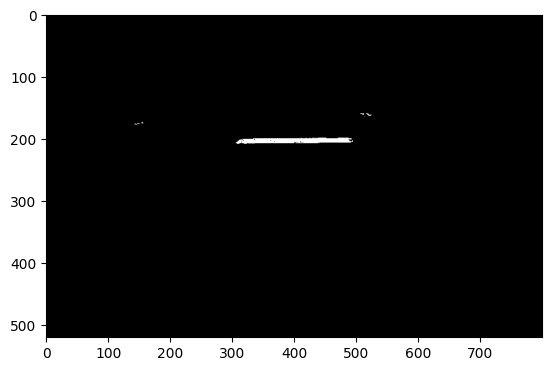

Index: 317 Non-zero pixel count: 2433


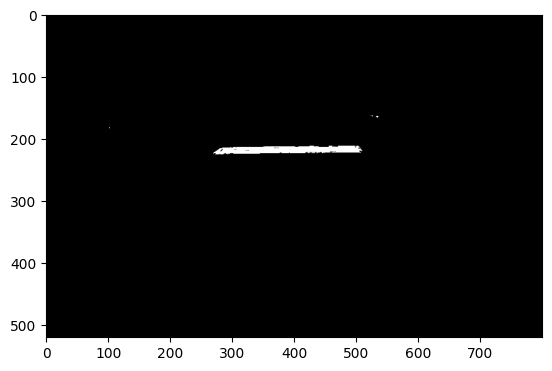

Index: 318 Non-zero pixel count: 853


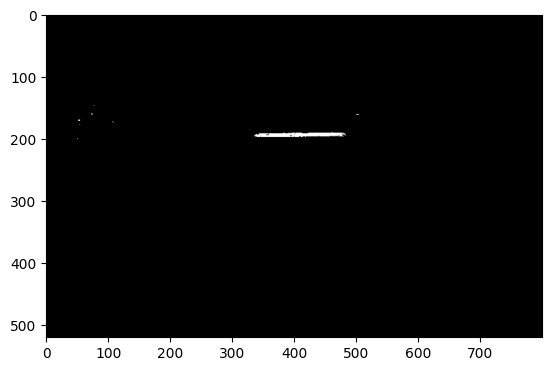

Index: 319 Non-zero pixel count: 3936


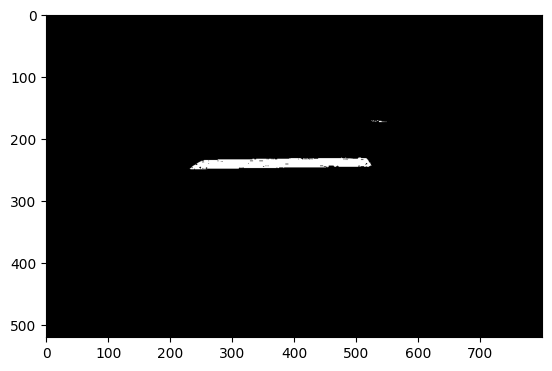

Non-zero pixel counts: [1368, 12057, 1077, 19473, 2085, 1126, 4232, 34402, 1551, 2653, 3368, 892, 1859, 64118, 1207, 947, 1450, 2433, 853, 3936]


In [ ]:
import matplotlib.pyplot as plt

nonzero_counts = []

for i in range(300, 320):
    img = np.copy(frames[i])
    count = 0
    img = img[200:, 200:1000]

    # Convert the frame to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Define the lower and upper range of red color in HSV
    lower_red = np.array([0, 95, 95])
    upper_red = np.array([15, 255, 255])

    # Create a mask of the red color using the defined range
    mask_red = cv2.inRange(hsv, lower_red, upper_red)

    # Apply a binary threshold to create a binary mask
    _, binary_mask = cv2.threshold(mask_red, 12, 255, cv2.THRESH_BINARY)

    # Count the number of non-zero pixels in the binary mask
    count = cv2.countNonZero(binary_mask)

    # Append the count to the list of nonzero_counts
    nonzero_counts.append(count)

    # Show the mask_red image and its non-zero pixel count
    print("Index:", i, "Non-zero pixel count:", count)
    plt.imshow(mask_red, cmap='gray')
    plt.show()

# Print the number of nonzero pixels for each frame
print("Non-zero pixel counts:", nonzero_counts)


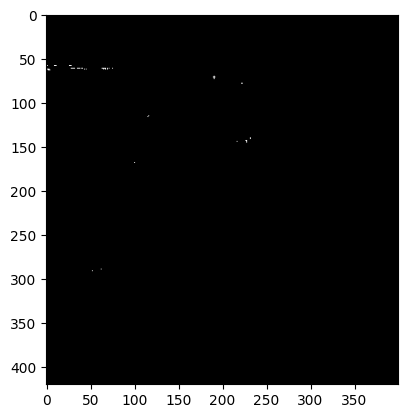

In [ ]:
img = np.copy(frames[193])[300:,:400]
detected_redline = False

# Convert the image to HSV color space
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Define the lower and upper bounds of the red color in HSV
lower_red = np.array([20, 100, 40])
upper_red = np.array([40, 255, 255])

# Create a mask to keep only the red pixels in the image
mask = cv2.inRange(hsv, lower_red, upper_red)

# Apply a binary threshold to convert the mask into a binary image
_, binary_mask = cv2.threshold(mask, 20, 255, cv2.THRESH_BINARY)

plt.imshow(mask, 'gray')
plt.show()
# plt.imshow(img)
# plt.show()

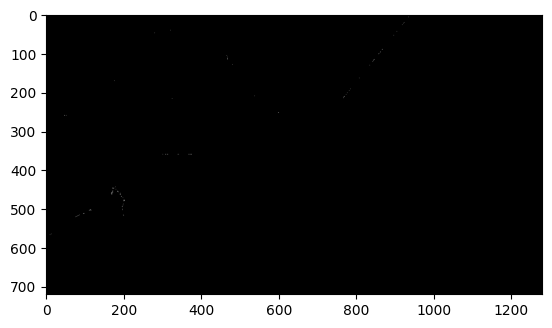

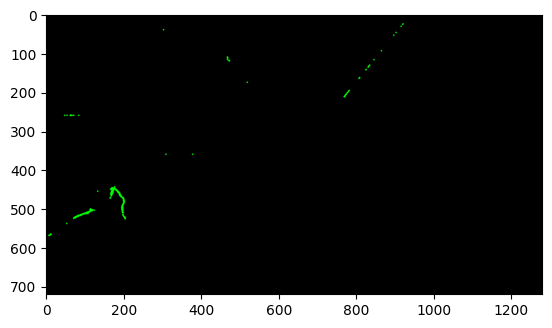

In [ ]:
img = np.copy(frames[193])

# Apply a color threshold to extract the red pixels
lower_red = (65, 50, 32)
upper_red = (75, 60, 44)
mask_red = cv2.inRange(img, lower_red, upper_red)

# Apply a binary threshold to create a binary mask
_, binary_mask = cv2.threshold(mask_red, 120, 255, cv2.THRESH_BINARY)

# Find the contours in the binary mask
contours, _ = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Create a blank image to draw the contours on
blank_img = np.zeros_like(img)

# Draw the contours on the blank image
cv2.drawContours(blank_img, contours, -1, (0, 255, 0), 3)

plt.imshow(blank_img)
plt.show()

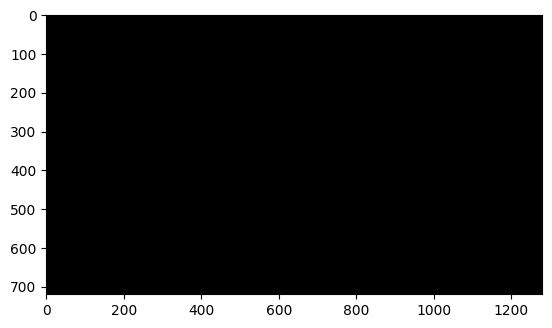

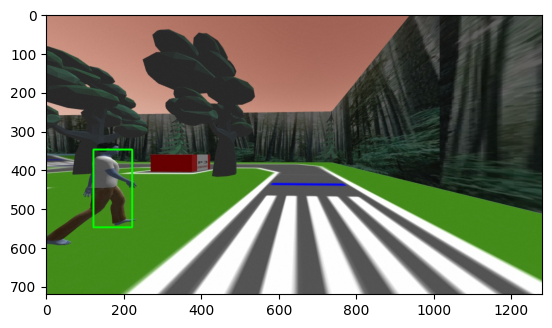

In [ ]:
img = np.copy(frames[193])

# Apply a color threshold to extract the red pixels
# lower_red = (71, 56, 38)
# upper_red = (75, 60, 44)
lower_red = (69, 56, 32)
upper_red = (75, 60, 44)
mask_red = cv2.inRange(img, lower_red, upper_red)

# Apply a binary threshold to create a binary mask
_, binary_mask = cv2.threshold(mask_red, 120, 255, cv2.THRESH_BINARY)

# Find the contours in the binary mask
contours, _ = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Sort the contours by their area (largest to smallest)
contours = sorted(contours, key=cv2.contourArea, reverse=True)

# Get the largest contour
largest_contour = contours[0]

# Draw a bounding rectangle around the largest contour
x, y, w, h = cv2.boundingRect(largest_contour)

# Define the size of the contour we want to draw
contour_size = (200, 100)

# Calculate the center of the bounding rectangle
center_x = x + w // 2
center_y = y + h // 2

# Calculate the top-left corner of the contour
contour_x = center_x - contour_size[1] // 2
contour_y = center_y - contour_size[0] // 2

# Draw the contour on a blank image
blank_img = np.zeros_like(img)
cv2.rectangle(img, (contour_x, contour_y), (contour_x + contour_size[1], contour_y + contour_size[0]), (0, 255, 0), 3)

plt.imshow(blank_img)
plt.show()
plt.imshow(img)
plt.show()

True


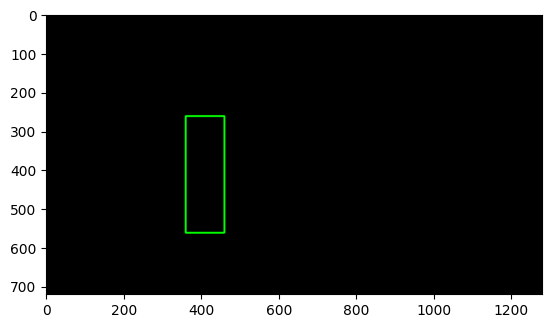

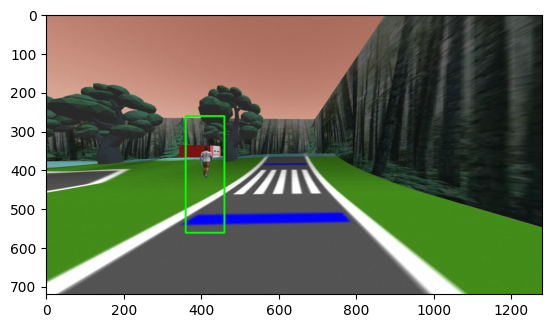

In [ ]:
img = np.copy(frames[298])

# Apply a color threshold to extract the red pixels
# lower_red = (65, 56, 38)
# upper_red = (75, 60, 44)
lower_red = (65, 50, 32)
upper_red = (75, 60, 44)
mask_red = cv2.inRange(img, lower_red, upper_red)

# Apply a binary threshold to create a binary mask
_, binary_mask = cv2.threshold(mask_red, 120, 255, cv2.THRESH_BINARY)

# Find the contours in the binary mask
contours, _ = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Sort the contours by their area (largest to smallest)
contours = sorted(contours, key=cv2.contourArea, reverse=True)

if len(contours) != 0:
  # Get the largest contour
  largest_contour = contours[0]

  # Draw a bounding rectangle around the largest contour
  x, y, w, h = cv2.boundingRect(largest_contour)

  # Define the size of the contour we want to draw
  contour_size = (300, 100)

  # Calculate the center of the bounding rectangle
  center_x = x + w // 2
  center_y = y + h // 2

  # Calculate the top-left corner of the contour
  contour_x = center_x - contour_size[1] // 2
  contour_y = center_y - contour_size[0] // 2

  # Draw the contour on a blank image
  blank_img = np.zeros_like(img)
  cv2.rectangle(blank_img, (contour_x, contour_y), (contour_x + contour_size[1], contour_y + contour_size[0]), (0, 255, 0), 3)
  cv2.rectangle(img, (contour_x, contour_y), (contour_x + contour_size[1], contour_y + contour_size[0]), (0, 255, 0), 3)

  if x > 200 and x < 400:
          move = True
print(move)
plt.imshow(blank_img)
plt.show()
plt.imshow(img)
plt.show()

True


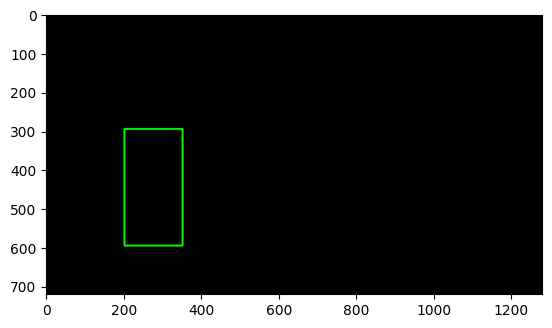

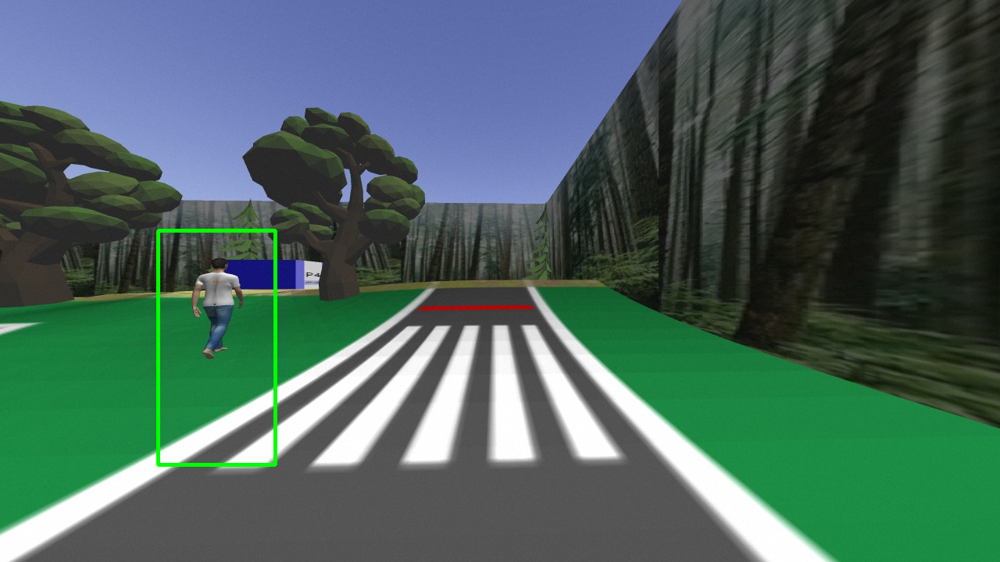

In [ ]:
move = False
img = np.copy(frames[320])

# Apply a color threshold to extract the red pixels
lower_red = (71, 56, 38)
upper_red = (75, 60, 44)
mask_red = cv2.inRange(img, lower_red, upper_red)

# Apply a binary threshold to create a binary mask
_, binary_mask = cv2.threshold(mask_red, 120, 255, cv2.THRESH_BINARY)

# Find the contours in the binary mask
contours, _ = cv2.findContours(binary_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Sort the contours by their area (largest to smallest)
contours = sorted(contours, key=cv2.contourArea, reverse=True)

# Get the largest contour
largest_contour = contours[0]

# Draw a bounding rectangle around the largest contour
x, y, w, h = cv2.boundingRect(largest_contour)

# Define the size of the contour we want to draw
contour_size = (300, 150)

# Calculate the center of the bounding rectangle
center_x = x + w // 2
center_y = y + h // 2

# Calculate the top-left corner of the contour
contour_x = center_x - contour_size[1] // 2
contour_y = center_y - contour_size[0] // 2

# Draw the contour on a blank image
blank_img = np.zeros_like(img)
cv2.rectangle(blank_img, (contour_x, contour_y), (contour_x + contour_size[1], contour_y + contour_size[0]), (0, 255, 0), 3)
cv2.rectangle(img, (contour_x, contour_y), (contour_x + contour_size[1], contour_y + contour_size[0]), (0, 255, 0), 3)

if x > 200 and x < 400:
        move = True
print(move)
plt.imshow(blank_img)
plt.show()
# plt.imshow(img)
# plt.show()
cv2_imshow(img)